<a href="https://colab.research.google.com/github/emely3h/Geospatial_ML/blob/feature%2Fadd-data-generators-to-fix-ram-problem/prepare_data/full_dataset_splitting_mmaps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concatenating tiles + creating a Training-Validation-Test Split

This is the last step in the prepare data pipeline. It requires that a compressed numpy file that contains one file for all input tiles and one file for all mask tiles for each of the 15 original images.

In this notebook the entire dataset is split into a training set, a validation set and a testing set. Different approaches where used for tiles that overlap and tiles that do not overlap. 

The resulting tiles for the different sets are saved in a numpy memory map for efficent RAM usage. 

### 0. Prepare Colab

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd drive/MyDrive/MachineLearning/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/15HUD3sGdfvxy5Y_bjvuXgrzwxt7TzRfm/MachineLearning


In [3]:
#! git clone https://github.com/emely3h/Geospatial_ML.git
%cd Geospatial_ML
! git checkout feature/add-data-generators-to-fix-ram-problem
! ls
#! git pull

/content/drive/.shortcut-targets-by-id/15HUD3sGdfvxy5Y_bjvuXgrzwxt7TzRfm/MachineLearning/Geospatial_ML
Already on 'feature/add-data-generators-to-fix-ram-problem'
Your branch is up to date with 'origin/feature/add-data-generators-to-fix-ram-problem'.
architecture.drawio  evaluation   models	README.md
data_exploration     experiments  prepare_data	requirements.txt


In [4]:
import numpy as np
import os
import datetime
from sklearn.model_selection import train_test_split
from prepare_data. concatenate import create_mmaps
from data_exploration.mask_stats import Mask_Stats
from prepare_data.train_val_test_split import split_dataset
from data_exploration.display_images import display
import matplotlib.pyplot as plt

## Preparing tiles

In [22]:
def print_img_shapes(data_path):
  total_tiles = 0
  for file in os.listdir(data_path):
    if not os.path.isdir(os.path.join(data_path, file)) and file.startswith('2022'):
    
      print(f'Image: {file}')
      array = np.load(f'{data_path}/{file}')
      total_tiles += array['x_input'].shape[0]
      print(array['x_input'].shape)
      print(array['y_mask'].shape)
      print()

  print(f'Total amount of tiles {total_tiles}')

## 1. Preparing non-overlapping tiles

### 1. Concatenating tiles of all images 

In [ ]:
total_tiles = 11121

In [ ]:
data_path = "../data_colab/256_256"
print_img_shapes(data_path)

Image: 2022_10_13.npz
(534, 256, 256, 5)
(534, 256, 256)

Image: 2022_07_15.npz
(534, 256, 256, 5)
(534, 256, 256)

Image: 2022_09_18.npz
(708, 256, 256, 5)
(708, 256, 256)

Image: 2022_06_20.npz
(761, 256, 256, 5)
(761, 256, 256)

Image: 2022_10_23.npz
(702, 256, 256, 5)
(702, 256, 256)

Image: 2022_07_25.npz
(761, 256, 256, 5)
(761, 256, 256)

Image: 2022_08_04.npz
(798, 256, 256, 5)
(798, 256, 256)

Image: 2022_07_10.npz
(822, 256, 256, 5)
(822, 256, 256)

Image: 2022_07_30.npz
(716, 256, 256, 5)
(716, 256, 256)

Image: 2022_08_14.npz
(711, 256, 256, 5)
(711, 256, 256)

Image: 2022_08_24.npz
(801, 256, 256, 5)
(801, 256, 256)

Image: 2022_09_03.npz
(728, 256, 256, 5)
(728, 256, 256)

Image: 2022_12_12.npz
(578, 256, 256, 5)
(578, 256, 256)

Image: 2022_09_08.npz
(561, 256, 256, 5)
(561, 256, 256)

Image: 2022_12_02.npz
(695, 256, 256, 5)
(695, 256, 256)

Image: 2022_09_13.npz
(711, 256, 256, 5)
(711, 256, 256)

Total amount of tiles 11121


In [ ]:
create_mmaps(total_tiles, '../data_colab/256_256', 'combined/x_input.npy', 'combined/y_mask.npy', 'combined/compressed.npz')

Started at: 2023-04-02 18:24:57.674674
loading file 1: 2022_10_13.npz shape: (534, 256, 256, 5) (534, 256, 256)
Chunk 0
Npz file indexes: 0 : 500
output file indexes: 0 : 500  Chunk shape (500, 256, 256) min: 0 max: 2 uniques: [0 1 2] type: <class 'numpy.uint8'>
Rest: 34
Npz file indexes: 500 : 534
output file indexes: 500 : 534  Chunk shape (34, 256, 256) min: 0 max: 2 uniques: [0 1 2] type: <class 'numpy.uint8'>

loading file 2: 2022_07_15.npz shape: (534, 256, 256, 5) (534, 256, 256)
Chunk 0
Npz file indexes: 0 : 500
output file indexes: 534 : 1034  Chunk shape (500, 256, 256) min: 0 max: 2 uniques: [0 1 2] type: <class 'numpy.uint8'>
Rest: 34
Npz file indexes: 500 : 534
output file indexes: 1034 : 1068  Chunk shape (34, 256, 256) min: 0 max: 2 uniques: [0 1 2] type: <class 'numpy.uint8'>

loading file 3: 2022_09_18.npz shape: (708, 256, 256, 5) (708, 256, 256)
Chunk 0
Npz file indexes: 0 : 500
output file indexes: 1068 : 1568  Chunk shape (500, 256, 256) min: 0 max: 2 uniques: [0 1

In [ ]:
def test_concatenating():
  y_mask_mm = np.memmap( f'{data_path}/combined/y_mask.npy', shape=(total_tiles, 256, 256),  dtype=np.uint8, mode='r')
  start_idx_mm = 0
  end_idx_mm = 0
  for file in os.listdir(data_path):
    if not os.path.isdir(os.path.join(data_path, file)) and file.startswith('2022'):
      print(f'Test file: {file}')

      y_mask_npz = np.load(f'{data_path}/{file}')['y_mask']

      stats_npz = Mask_Stats(y_mask_npz)
      end_idx_mm += y_mask_npz.shape[0]

      stats_mm = Mask_Stats(y_mask_mm[start_idx_mm:end_idx_mm])
      print(f'Land pixels: npz: {stats_npz.pix_land} mm: {stats_mm.pix_land}')
      assert stats_npz.pix_land == stats_mm.pix_land
      print(f'Valid pixels: npz: {stats_npz.pix_valid} mm: {stats_mm.pix_valid}')
      assert stats_npz.pix_valid == stats_mm.pix_valid
      print(f'Invalid pixels: npz: {stats_npz.pix_invalid} mm: {stats_mm.pix_invalid}')
      assert stats_npz.pix_invalid == stats_mm.pix_invalid
      start_idx_mm = end_idx_mm
      print()
# todo: only tests mask tiles, not input tiles

test_concatenating()

Test file: 2022_10_13.npz
Land pixels: npz: 14807654 mm: 14807654
Valid pixels: npz: 6006843 mm: 6006843
Invalid pixels: npz: 14181727 mm: 14181727

Test file: 2022_07_15.npz
Land pixels: npz: 13916296 mm: 13916296
Valid pixels: npz: 3488390 mm: 3488390
Invalid pixels: npz: 17591538 mm: 17591538

Test file: 2022_09_18.npz
Land pixels: npz: 19937643 mm: 19937643
Valid pixels: npz: 22695686 mm: 22695686
Invalid pixels: npz: 3766159 mm: 3766159

Test file: 2022_06_20.npz
Land pixels: npz: 23203896 mm: 23203896
Valid pixels: npz: 21241348 mm: 21241348
Invalid pixels: npz: 5427652 mm: 5427652

Test file: 2022_10_23.npz
Land pixels: npz: 20581484 mm: 20581484
Valid pixels: npz: 5006533 mm: 5006533
Invalid pixels: npz: 20418255 mm: 20418255

Test file: 2022_07_25.npz
Land pixels: npz: 23049358 mm: 23049358
Valid pixels: npz: 23504823 mm: 23504823
Invalid pixels: npz: 3318715 mm: 3318715

Test file: 2022_08_04.npz
Land pixels: npz: 25238972 mm: 25238972
Valid pixels: npz: 19977818 mm: 19977818

### 2. Splitting dataset into train, validation and and test set 

In [ ]:
split_dataset(1000, total_tiles, data_path, 1)

Started at: 2023-04-02 22:36:51.525169
0
cut at: 0:1000
Chunk: 0, x_input: (1000, 256, 256, 5), y_mask: (1000, 256, 256), train_idx: 0, val_idx: 0, test_idx: 0
Split counter 0, diff: 8.652999877929688
Split counter 1, diff: 2.8532892862955705
Split counter 2, diff: 6.798698425292969
Split counter 3, diff: 2.8150711059570312
Split counter 4, diff: 6.536872863769531
Split counter 5, diff: 2.973052978515625
Split counter 6, diff: 1.8633193969726562
Split counter 7, diff: 1.9681371053059848
Split counter 8, diff: 5.025502522786454
Split counter 9, diff: 8.149093627929688
Split counter 10, diff: 3.2454681396484375
Split counter 11, diff: 3.6481781005859375
Split counter 12, diff: 3.737909952799484
Split counter 13, diff: 1.7307815551757812
Split counter 14, diff: 2.398343404134117
Split counter 15, diff: 8.811337788899735
Split counter 16, diff: 1.6047439575195312
Split counter 17, diff: 2.7766647338867188
Split counter 18, diff: 5.356254577636719
Split counter 19, diff: 1.988009134928383
S

### 3. Validate

In [15]:
train_tiles = total_tiles // 100 * 60 +1
test_val_tiles = total_tiles // 100 * 20 +1

train_split_x = np.memmap(os.path.join(data_path, "train_split_x.npy"), mode="r", shape=(train_tiles, 256, 256, 5), dtype=np.float32)
train_split_y = np.memmap(os.path.join(data_path, "train_split_y.npy"), mode="r", shape=(train_tiles, 256, 256), dtype=np.float32)
test_split_x = np.memmap(os.path.join(data_path, "test_split_x.npy"), mode="r", shape=(test_val_tiles, 256, 256, 5), dtype=np.float32)
test_split_y = np.memmap(os.path.join(data_path, "test_split_y.npy"), mode="r", shape=(test_val_tiles, 256, 256), dtype=np.float32)
val_split_x = np.memmap(os.path.join(data_path, "val_split_x.npy"), mode="r", shape=(test_val_tiles, 256, 256, 5), dtype=np.float32)
val_split_y = np.memmap(os.path.join(data_path, "val_split_y.npy"), mode="r", shape=(test_val_tiles, 256, 256), dtype=np.float32)

train_stats = Mask_Stats(train_split_y)
train_stats.print_stats()
print()
val_stats = Mask_Stats(val_split_y)
val_stats.print_stats()
print()
test_stats = Mask_Stats(test_split_y)
test_stats.print_stats()
print()


NameError: ignored

(10, 256, 256, 5)
(10, 256, 256)
(256, 256, 4) (256, 256)
69.0 | 255.0 | 0.0 | 2.0


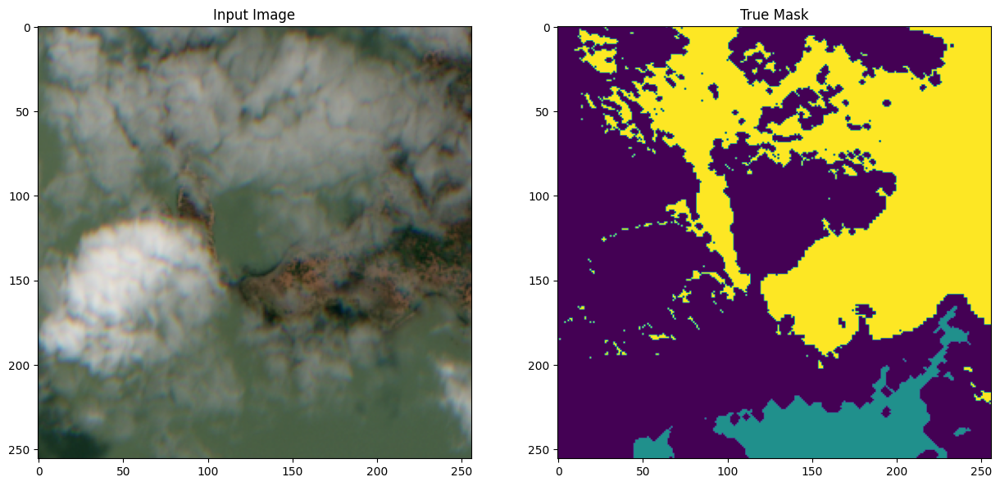

(256, 256, 4) (256, 256)
91.0 | 255.0 | 0.0 | 2.0


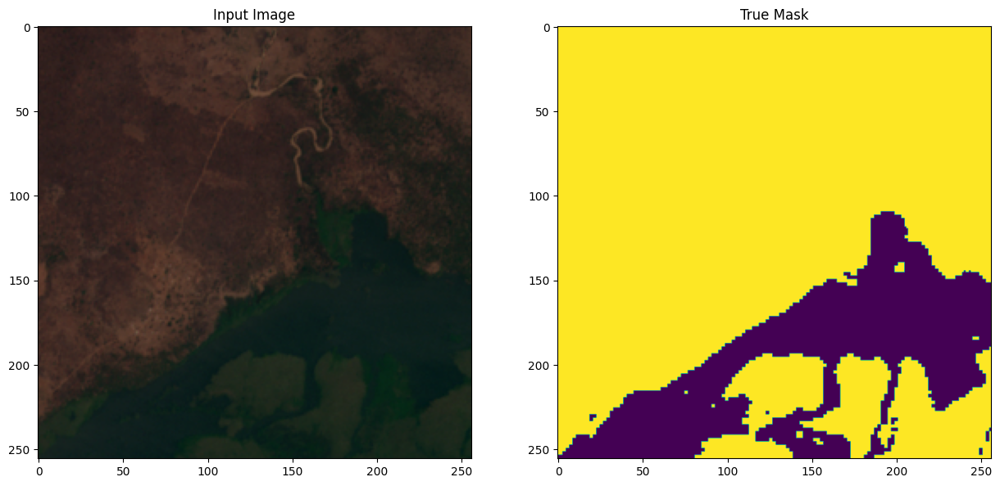

(256, 256, 4) (256, 256)
47.0 | 255.0 | 0.0 | 2.0


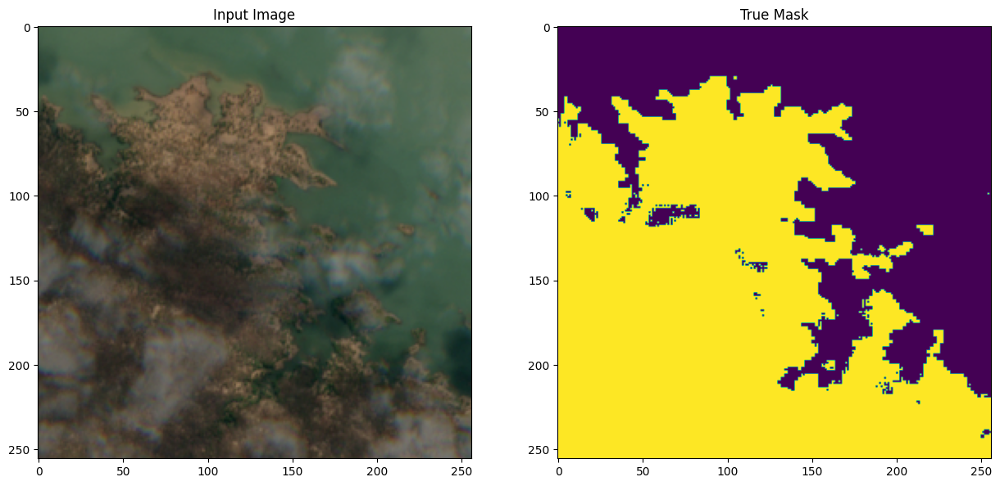

(256, 256, 4) (256, 256)
97.0 | 255.0 | 0.0 | 2.0


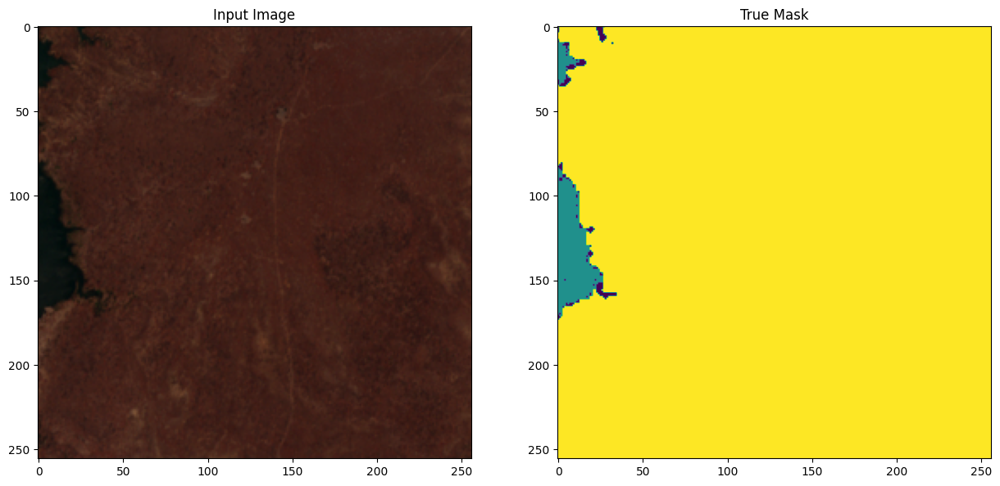

(256, 256, 4) (256, 256)
76.0 | 255.0 | 0.0 | 2.0


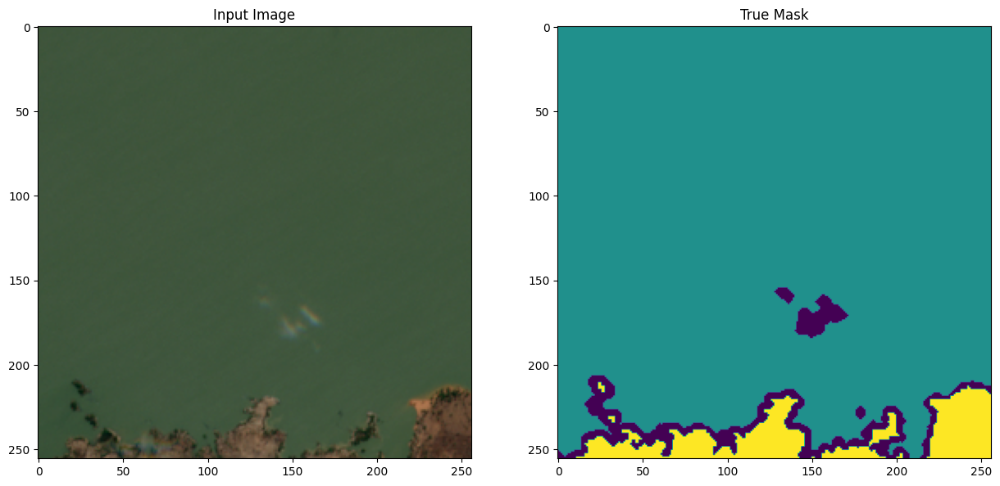

(256, 256, 4) (256, 256)
64.0 | 255.0 | 0.0 | 2.0


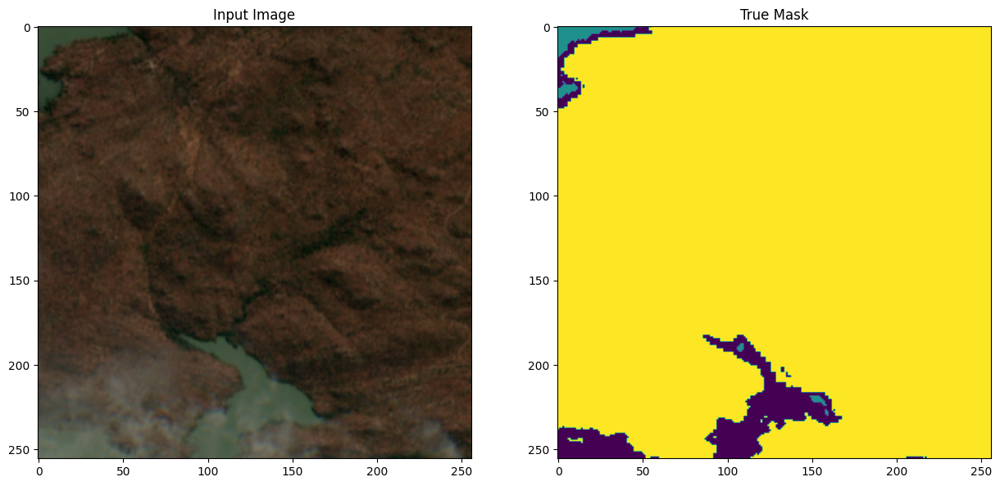

(256, 256, 4) (256, 256)
112.0 | 255.0 | 0.0 | 2.0


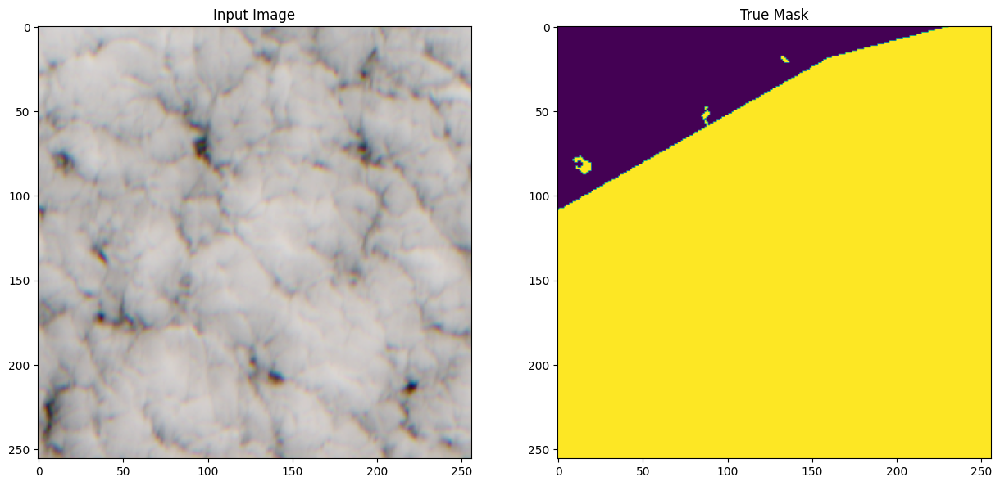

(256, 256, 4) (256, 256)
86.0 | 255.0 | 0.0 | 2.0


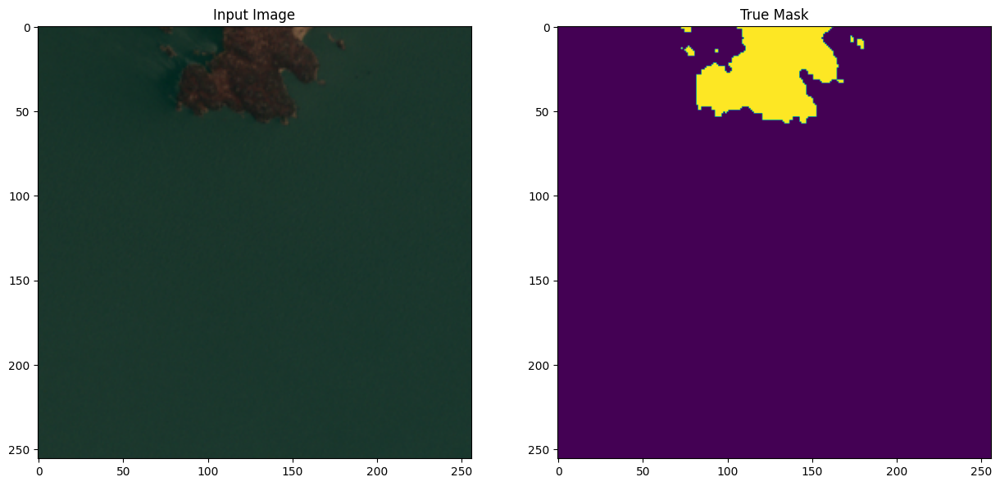

(256, 256, 4) (256, 256)
90.0 | 255.0 | 0.0 | 2.0


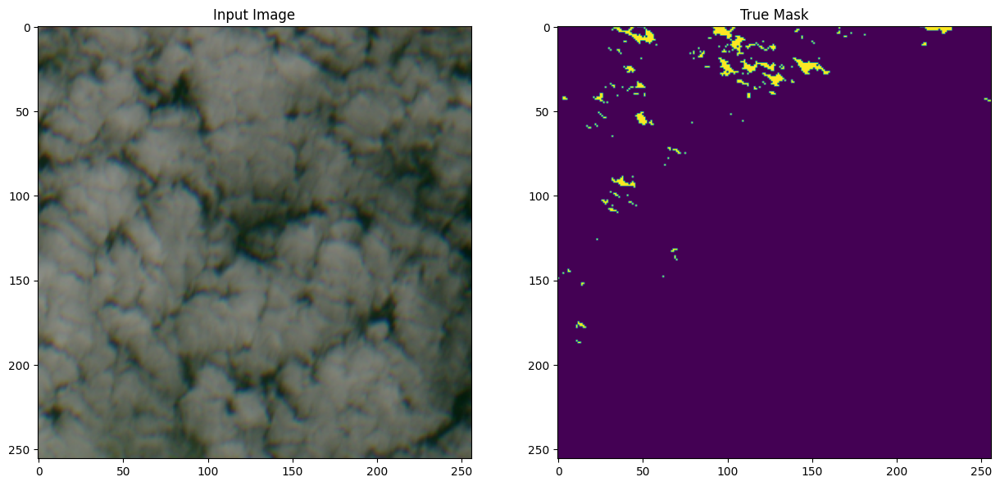

(256, 256, 4) (256, 256)
96.0 | 255.0 | 0.0 | 2.0


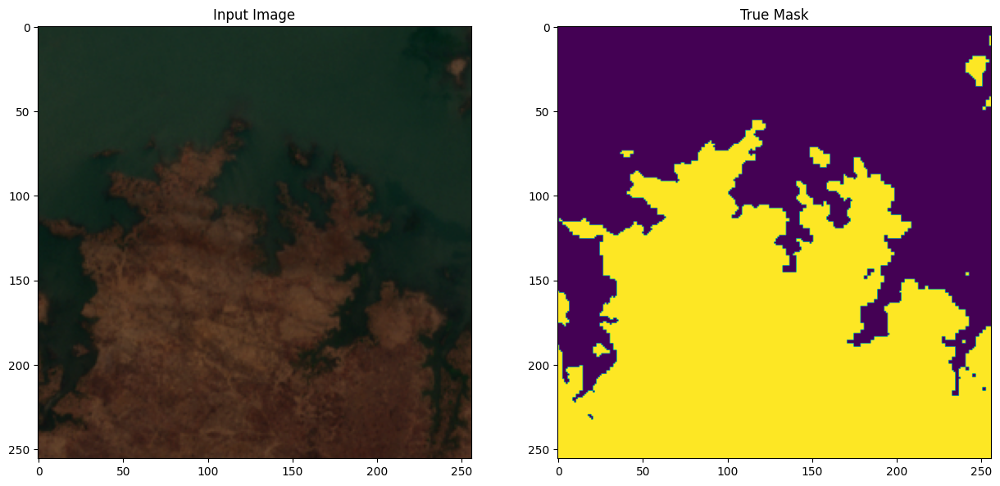

In [ ]:
print(train_split_x[10:20].shape)
print(train_split_y[10:20].shape)
display(train_split_x[10:20], train_split_y[10:20])

## 2. Preparing overlapping tiles

When evaluating the model based on calculated metrics it is important to use data that the model has never seen before. As experiment two shows that it is beneficial if the tiles in which the images are split overlap it is crucial that tiles of the same original images don't appear in e.g. training data and test data.

The data exploration notebook showed that the following split takes into account the different number of tiles and the different proportion of invalid pixels.

#### Training Set Images

60.43 % of total tiles, 59.64 % of total invalid pixels, 11063 tiles

- 2022_07_25.npz
- 2022_08_14.npz
- 2022_10_23.npz
- 2022_10_13.npz
- 2022_07_30.npz
- 2022_07_10.npz
- 2022_08_04.npz
- 2022_07_15.npz
- 2022_12_12.npz
- 2022_09_08.npz



#### Validation Set Images

19.36 % of total tiles, 19.54 % of total invalid pixels, 3545 tiles

- 2022_09_13.npz
- 2022_09_03.npz
- 2022_09_18.npz


#### Test Set Images

20.20 % of total tiles, 20.82 % of total invalid pixels, 3699 tiles

- 2022_12_02.npz
- 2022_06_20.npz
- 2022_08_24.npz




### 1. Concatenate tiles for sets

In [14]:
data_path = "../data_colab/256_200"

training_imgs = ['2022_07_25.npz', '2022_08_14.npz', '2022_10_23.npz', '2022_10_13.npz', '2022_07_30.npz', '2022_07_10.npz', '2022_08_04.npz', '2022_07_15.npz', '2022_12_12.npz', '2022_09_08.npz']
validation_imgs = ['2022_09_13.npz', '2022_09_03.npz', '2022_09_18.npz']
test_imgs = ['2022_12_02.npz', '2022_06_20.npz', '2022_08_24.npz']

train_total_tiles = 11063
val_total_tiles = 3545
test_total_tiles = 3699


print(f'Started at: {datetime.datetime.now()}')

print('Creating training mmap')
create_mmaps(train_total_tiles, data_path, 'train_split_x.npy', 'train_split_y.npy', 'train_compressed.npz', training_imgs)

print('Creating validation mmap')
create_mmaps(val_total_tiles, data_path, 'val_split_x.npy', 'val_split_y.npy', 'val_compressed.npz', validation_imgs)

print('Creating test mmap')
create_mmaps(test_total_tiles, data_path, 'test_split_x.npy', 'test_split_y.npy', 'test_compressed.npz', test_imgs)

print(f'Finished at: {datetime.datetime.now()}')

# recalculate stats
# display images

Started at: 2023-04-04 21:50:27.387064
Creating training mmap
Started at: 2023-04-04 21:50:27.388813
Creating x_mmap with shape (11063, 256, 256, 5)
Creating y_mmap with shape (11063, 256, 256)
loading file 1: 2022_07_25.npz shape: (1258, 256, 256, 5) (1258, 256, 256)
Chunk 0
Npz file indexes: 0 : 500
output file indexes: 0 : 500  Chunk shape (500, 256, 256) min: 0 max: 2 uniques: [0 1 2] type: <class 'numpy.uint8'>
Writing chunks of shape (500, 256, 256, 5) (500, 256, 256)
Chunk 1
Npz file indexes: 500 : 1000
output file indexes: 500 : 1000  Chunk shape (500, 256, 256) min: 0 max: 2 uniques: [0 1 2] type: <class 'numpy.uint8'>
Writing chunks of shape (500, 256, 256, 5) (500, 256, 256)
Rest: 258
Npz file indexes: 1000 : 1258
output file indexes: 1000 : 1258  Chunk shape (258, 256, 256) min: 0 max: 2 uniques: [0 1 2] type: <class 'numpy.uint8'>
Writing chunks of shape (258, 256, 256, 5) (258, 256, 256)

loading file 2: 2022_08_14.npz shape: (1179, 256, 256, 5) (1179, 256, 256)
Chunk 0
N

### 2. Validate

In [16]:
data_path = "../data_colab/256_200"
train_total_tiles = 11063
val_total_tiles = 3545
test_total_tiles = 3699

train_split_x = np.memmap(os.path.join(data_path, "train_split_x.npy"), mode="r", shape=(train_total_tiles, 256, 256, 5), dtype=np.uint8)
train_split_y = np.memmap(os.path.join(data_path, "train_split_y.npy"), mode="r", shape=(train_total_tiles, 256, 256), dtype=np.uint8)
val_split_x = np.memmap(os.path.join(data_path, "val_split_x.npy"), mode="r", shape=(val_total_tiles, 256, 256, 5), dtype=np.uint8)
val_split_y = np.memmap(os.path.join(data_path, "val_split_y.npy"), mode="r", shape=(val_total_tiles, 256, 256), dtype=np.uint8)
test_split_x = np.memmap(os.path.join(data_path, "test_split_x.npy"), mode="r", shape=(test_total_tiles, 256, 256, 5), dtype=np.uint8)
test_split_y = np.memmap(os.path.join(data_path, "test_split_y.npy"), mode="r", shape=(test_total_tiles, 256, 256), dtype=np.uint8)

train_stats = Mask_Stats(train_split_y)
train_stats.print_stats()
print()
val_stats = Mask_Stats(val_split_y)
val_stats.print_stats()
print()
test_stats = Mask_Stats(test_split_y)
test_stats.print_stats()
print()

Shape: (11063, 256, 256)
Land pixels: 326666615  45.056 %
Valid pixels: 231026701  31.865 %
Invalid pixels: 167331452  23.079 %
Sum: 11063

Shape: (3545, 256, 256)
Land pixels: 100682317  43.337 %
Valid pixels: 76811432  33.062 %
Invalid pixels: 54831371  23.601 %
Sum: 3545

Shape: (3699, 256, 256)
Land pixels: 112712687  46.495 %
Valid pixels: 71301683  29.413 %
Invalid pixels: 58403294  24.092 %
Sum: 3699



#### Display images

(10, 256, 256, 5)
(10, 256, 256)


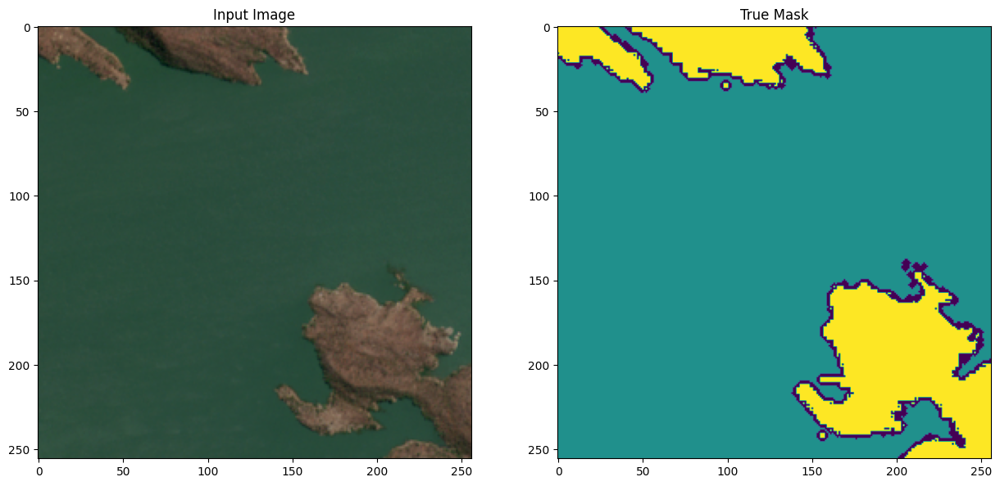

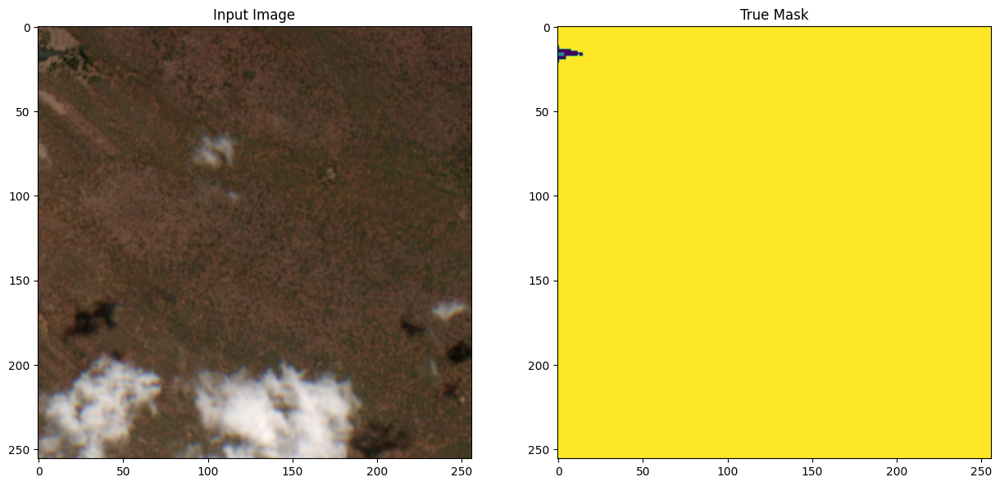

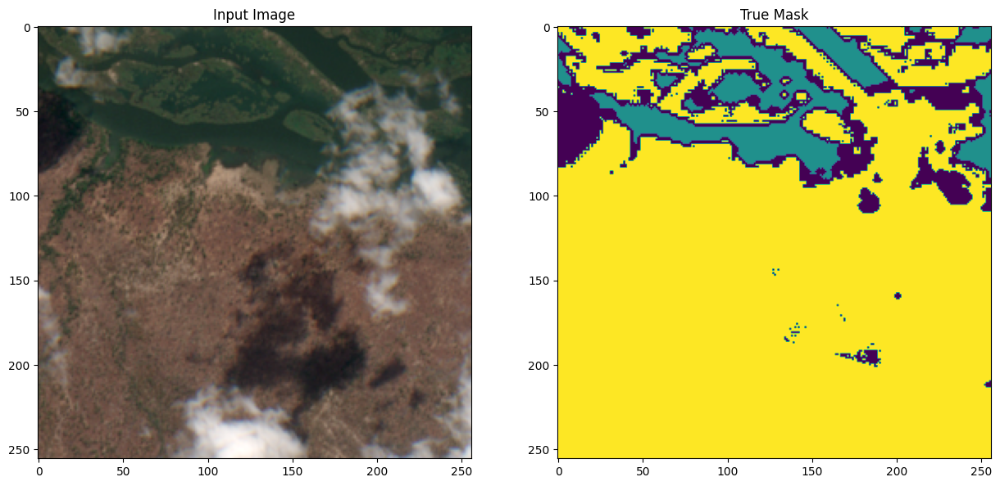

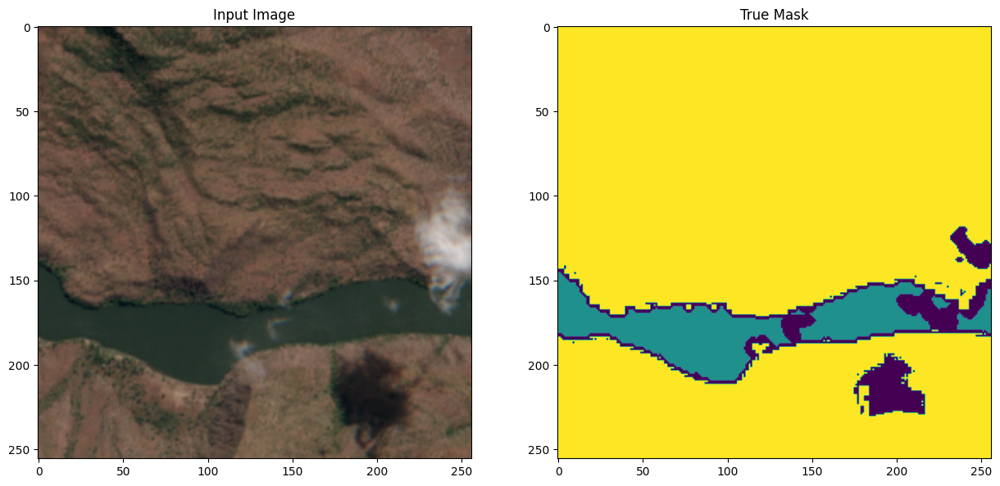

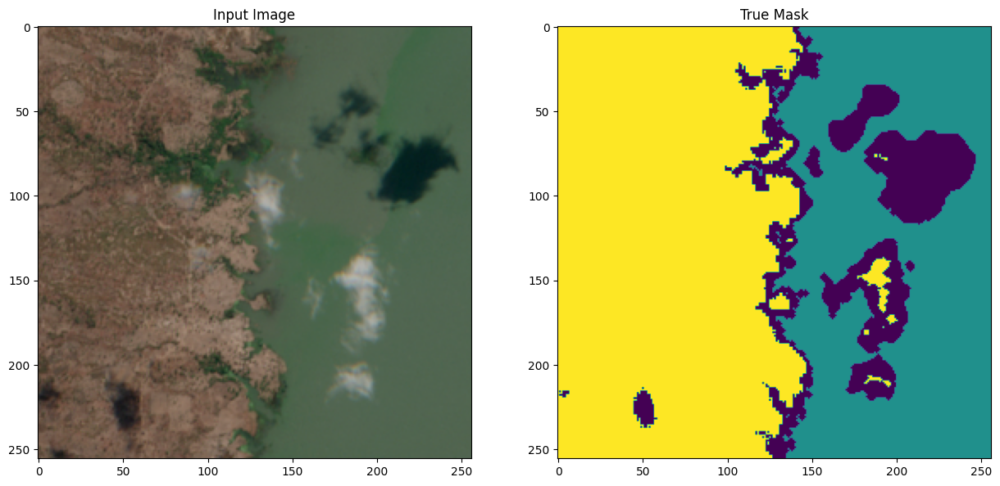

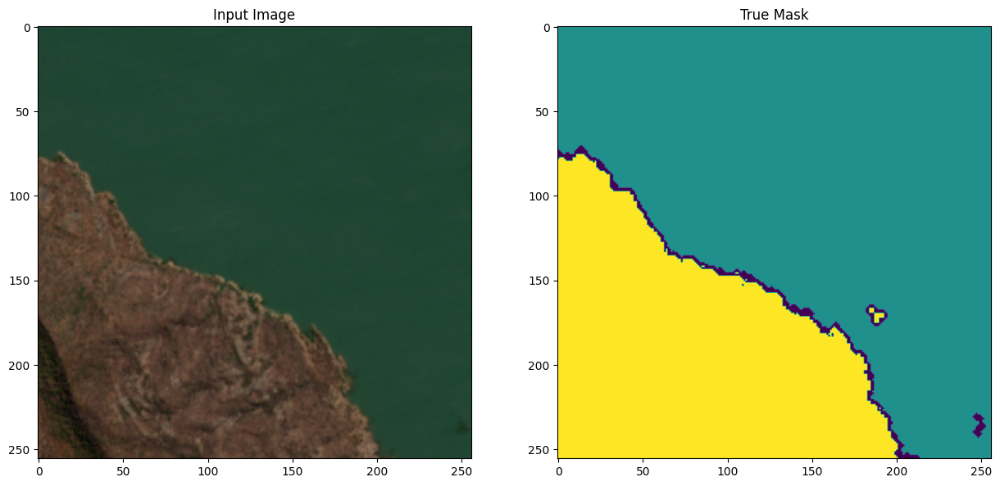

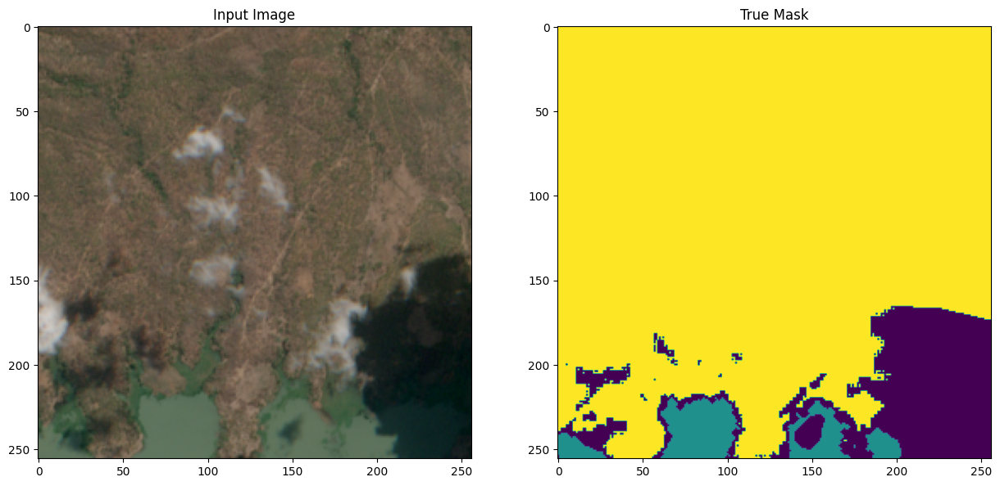

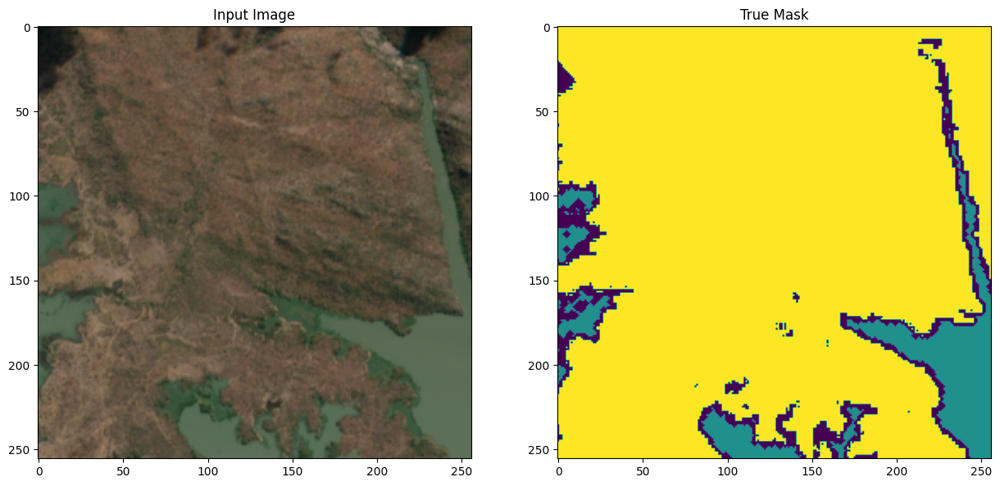

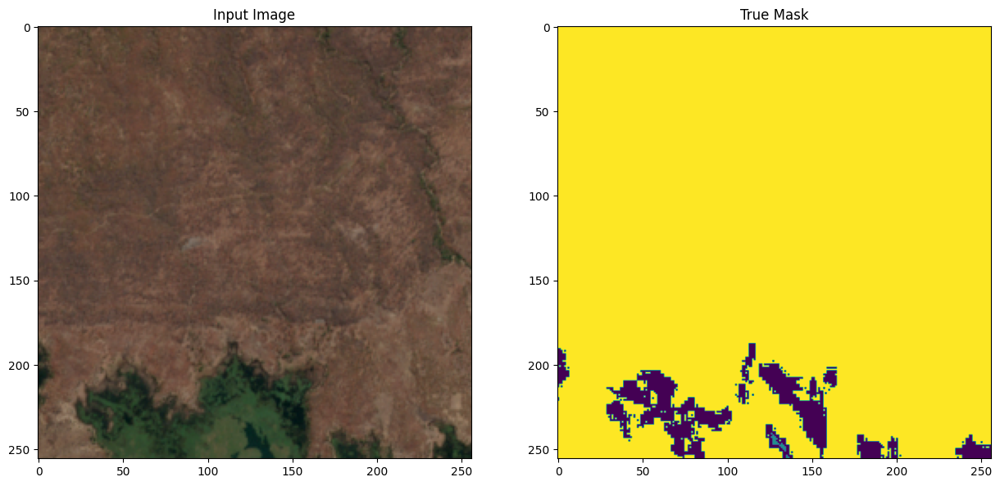

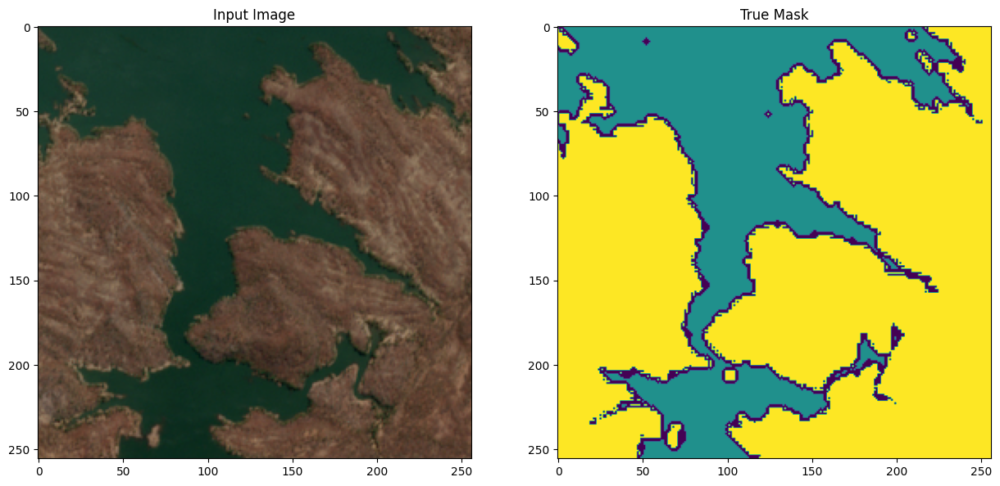

In [17]:
print(train_split_x[10:20].shape)
print(train_split_y[10:20].shape)
display(train_split_x[10:20], train_split_y[10:20])

(5, 256, 256, 5)
(5, 256, 256)


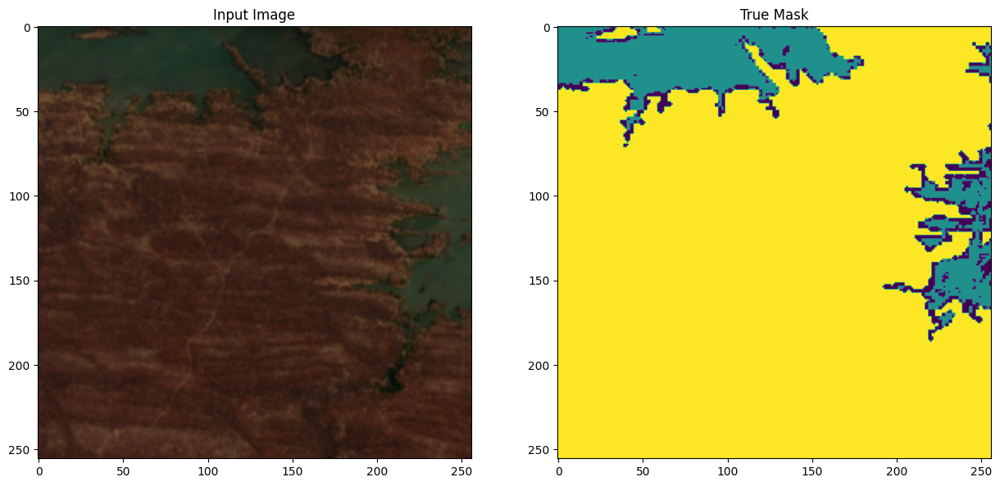

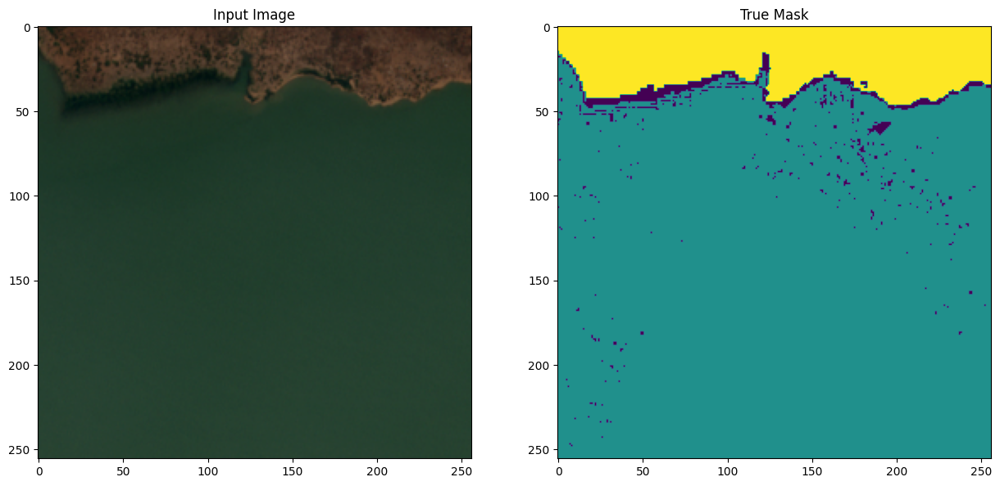

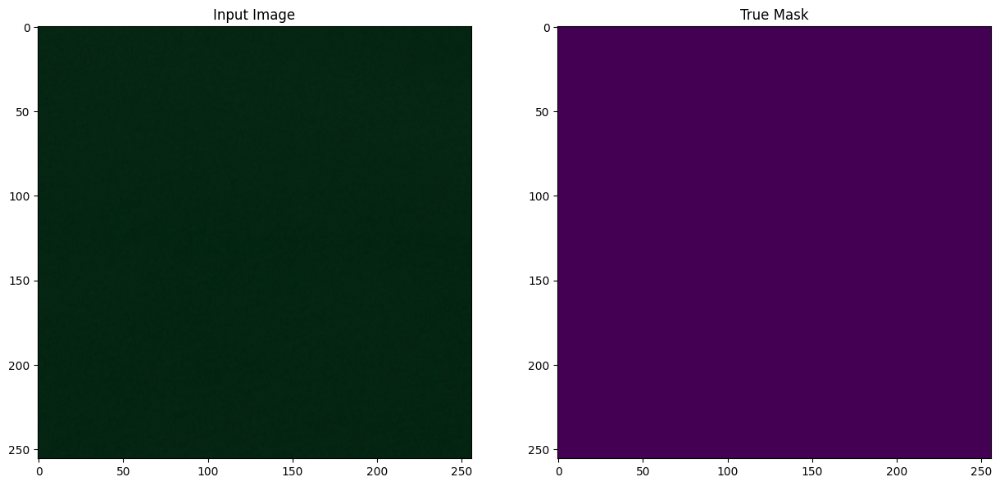

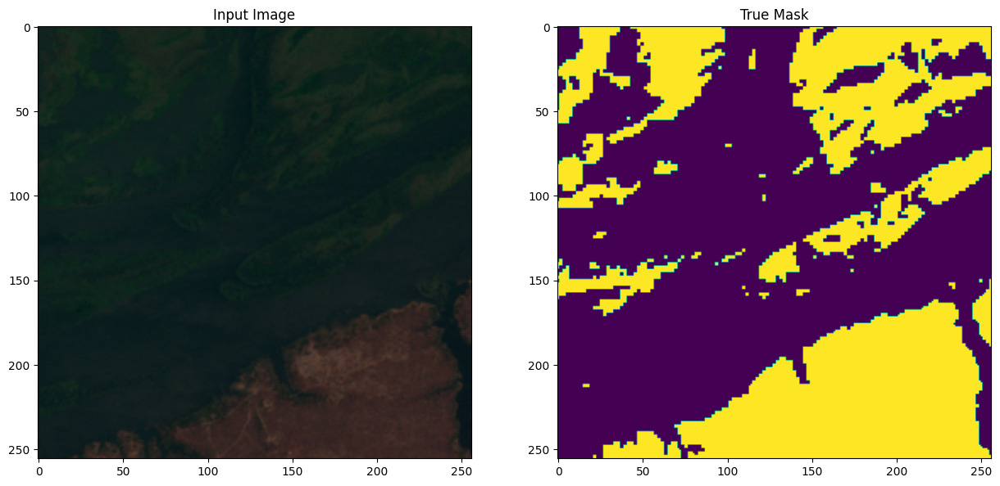

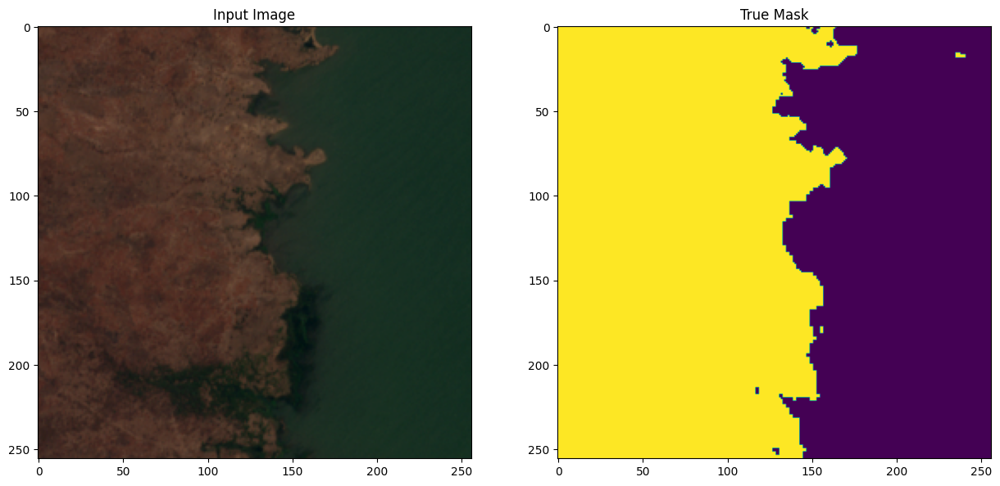

In [18]:
print(val_split_x[100:105].shape)
print(val_split_y[100:105].shape)
display(val_split_x[100:105], val_split_y[100:105])

(5, 256, 256, 5)
(5, 256, 256)


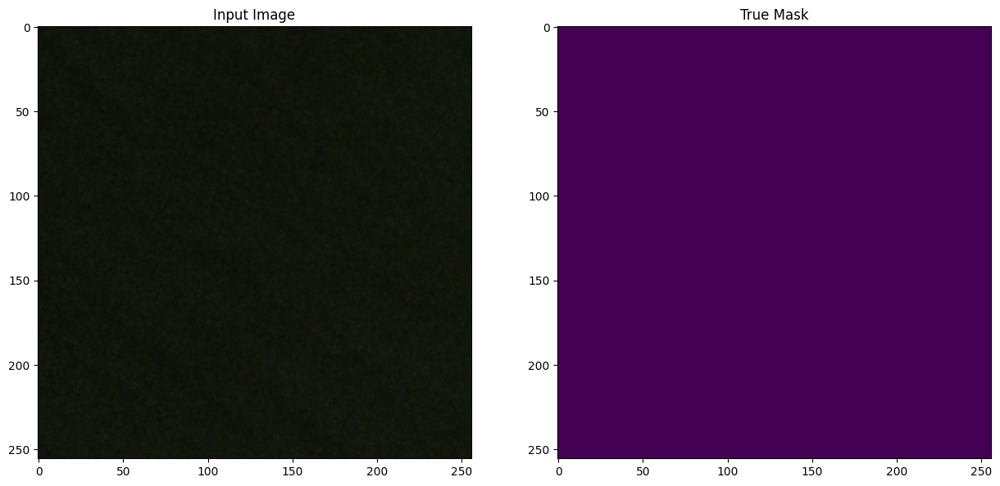

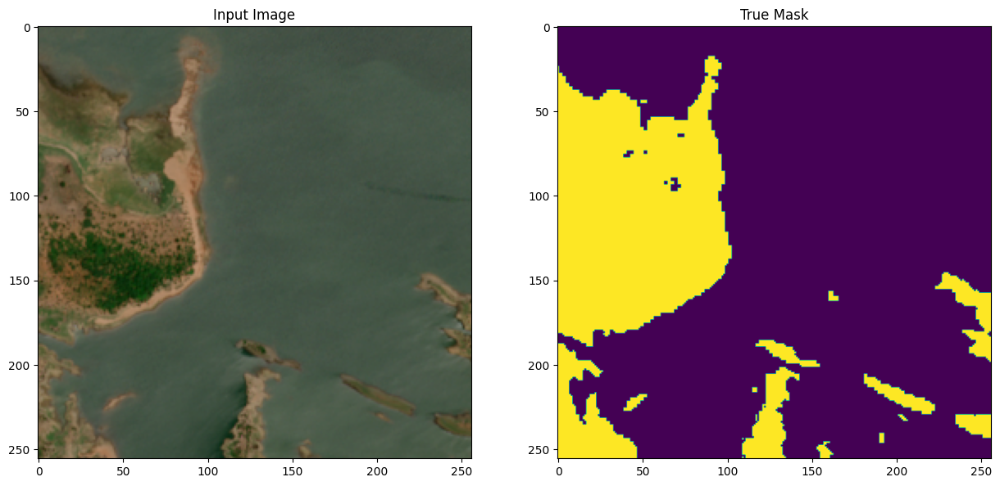

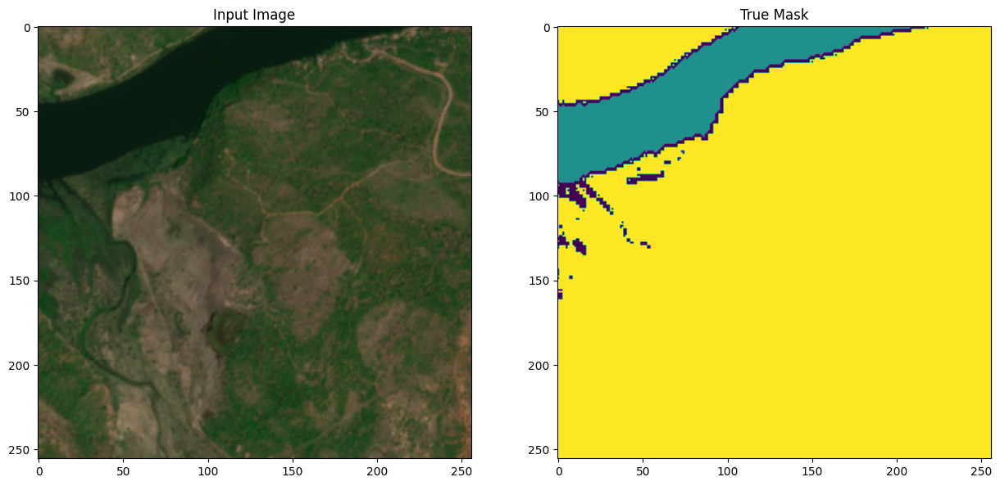

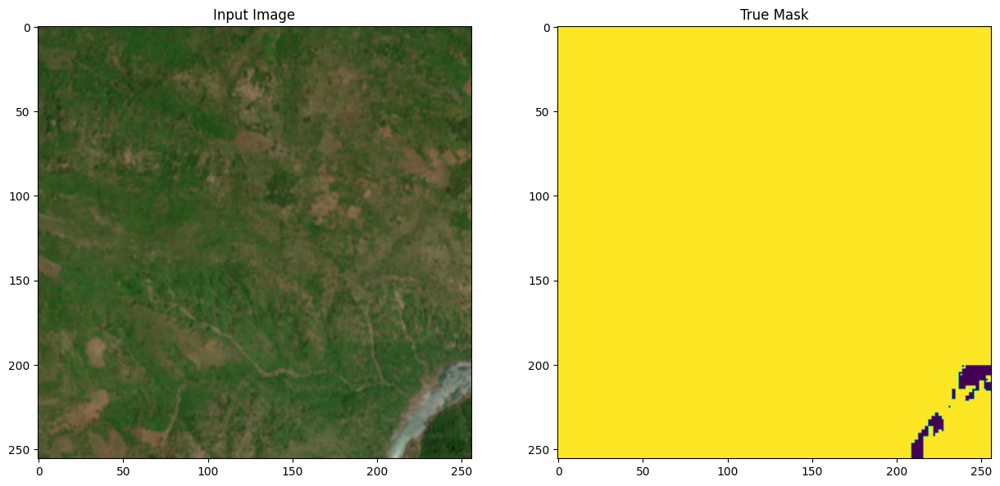

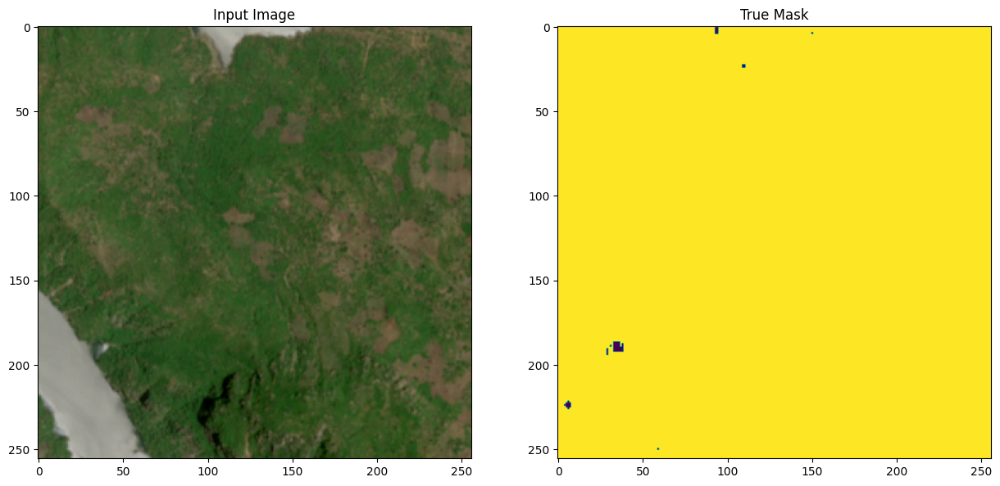

In [19]:
print(test_split_x[1000:1005].shape)
print(test_split_y[1000:1005].shape)
display(test_split_x[1000:1005], test_split_y[1000:1005])